<a href="https://colab.research.google.com/github/SVJLucas/classic-watermark-analysis/blob/main/code/evaluation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Downloading the Dataset

In [1]:
!wget https://astro.utoronto.ca/~hleung/shared/Galaxy10/Galaxy10_DECals.h5 -O Galaxy10_DECals.h5 --no-check-certificate

--2024-02-19 08:34:03--  https://astro.utoronto.ca/~hleung/shared/Galaxy10/Galaxy10_DECals.h5
Resolving astro.utoronto.ca (astro.utoronto.ca)... 142.1.217.162
Connecting to astro.utoronto.ca (astro.utoronto.ca)|142.1.217.162|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2735267419 (2.5G)
Saving to: ‘Galaxy10_DECals.h5’

Galaxy10_DECals.h5  100%[===================>]   2.55G  16.0MB/s    in 2m 45s  

2024-02-19 08:36:49 (15.8 MB/s) - ‘Galaxy10_DECals.h5’ saved [2735267419/2735267419]



# Opening the Image that we're going to mark

In [2]:
import h5py
import numpy as np
def load_low_redshift_good_galaxies(data_path: str) -> tuple[np.ndarray, np.ndarray]:
    """
    Loads real galaxy images and redshifts from a DECals dataset, selects unbarred spiral galaxies
    with redshift z < 0.02, and filters for one user-specified galaxy.

    Args:
        data_path (str): Path to the DECals dataset HDF5 file.

    Returns:
        tuple: The image to be watermarked

    Raises:
        FileNotFoundError: If the data file is not found.
    """

    try:
        with h5py.File(data_path, 'r') as f:
            images = np.array(f['images'])
            labels = np.array(f['ans'])
            redshifts = np.array(f['redshift'])

        unbarred_spiral_indices = np.where(labels == 6)
        unbarred_spiral_images = images[unbarred_spiral_indices]
        unbarred_spiral_redshifts = redshifts[unbarred_spiral_indices]

        low_redshift_indices = np.where(unbarred_spiral_redshifts < 0.02)
        low_redshift_images = unbarred_spiral_images[low_redshift_indices]
        low_redshift_redshifts = unbarred_spiral_redshifts[low_redshift_indices]

        return low_redshift_images[13][:,:,1]

    except FileNotFoundError:
        raise FileNotFoundError("DECals dataset file not found!")

data_path = "/content/Galaxy10_DECals.h5"
original_image = load_low_redshift_good_galaxies(data_path)
print("Number of loaded galaxies:", len(original_image))

Number of loaded galaxies: 256


# Generating the Watermark

In [8]:
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import numpy as np

def generate_dog_mask(size: tuple[int, int]) -> np.ndarray:
    """
    Generates a grayscale image of a simple dog shape mask with a given size.

    Args:
        size (tuple[int, int]): The width and height for the image size.

    Returns:
        np.ndarray: The generated image as a numpy array.
    """
    # Calculate scale ratios for width and height
    width_scale = size[0] / 128
    height_scale = size[1] / 128

    # Create a new image with mode 'L' for grayscale and the given size
    img = Image.new('L', size, 0)

    # Initialize ImageDraw to draw on the image
    draw = ImageDraw.Draw(img)

    # Define a simple dog shape using a combination of ellipses and rectangles, scaled according to the image size
    # Head
    draw.ellipse(
        (28 * width_scale, 32 * height_scale, 100 * width_scale, 104 * height_scale),
        fill=255
    )
    # Ears
    draw.ellipse(
        (28 * width_scale, 12 * height_scale, 48 * width_scale, 52 * height_scale),
        fill=255
    )
    draw.ellipse(
        (80 * width_scale, 12 * height_scale, 100 * width_scale, 52 * height_scale),
        fill=255
    )

    # Convert the PIL Image to a numpy array
    watermark = np.array(img, dtype=np.uint32)

    return watermark

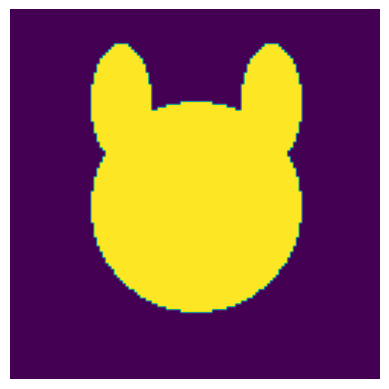

In [9]:
watermark = generate_dog_mask((128,128))
plt.imshow(watermark)
plt.axis('off')
plt.show()

# Testing Class

### Simulated Attacks

- **Rotation Attack Test**:The Rotation Attack Test evaluates an algorithm's tolerance to orientation changes by rotating images by a random angle within a specified range (e.g., -5 to 5 degrees). This simulates real-world variations in camera angle or object orientation, challenging the algorithm's ability to recognize rotated objects without loss of accuracy.

- **Noise Test**: The Noise Test assesses an algorithm's robustness against visual noise by adding Gaussian noise with a random standard deviation to images. This mimics sensor noise or low-light conditions, testing the algorithm's capability to maintain performance despite the presence of random pixel value fluctuations.

- **Crop Ratio Test**: The Crop Ratio Test determines the impact of partial visibility on algorithm performance by cropping a random percentage of the image's border and resizing it back to the original dimensions. This simulates scenarios where objects are partially occluded or outside the camera's field of view.

- **Resize Scale Test**: The Resize Scale Test investigates the algorithm's resilience to scale variations by resizing images by a random scale factor and then resizing back to original dimensions. It mimics real-world conditions of objects appearing larger or smaller due to changes in distance to the camera.

- **Gaussian Blur Test**: The Gaussian Blur Test examines an algorithm's ability to handle images with reduced sharpness by applying Gaussian blur with a random intensity. This simulates motion blur or out-of-focus conditions, challenging the algorithm's capacity to recognize blurred objects.

- **Brightness Test**: The Brightness Test evaluates how changes in image brightness affect an algorithm's performance by adjusting the brightness with a random value within a specified range. This test simulates variations in lighting conditions, from underexposure to overexposure.

- **Contrast Test**: The Contrast Test assesses the effect of contrast adjustments on an algorithm's accuracy by modifying the contrast of images with a random factor. This simulates conditions with varying levels of contrast, testing the algorithm's ability to discern objects against backgrounds with minimal to significant contrast differences.

Each attack provides insight into specific aspects of algorithm robustness, highlighting vulnerabilities and areas for improvement in handling real-world image variations.

In [4]:
import numpy as np
import cv2
from skimage.transform import resize, rotate
from skimage.filters import gaussian
from skimage import exposure
from sklearn.metrics import confusion_matrix

class TestSuite:
    def __init__(self, model, num_samples_per_test=5):
        self.model = model
        self.num_samples_per_test = num_samples_per_test

        self.tests = [
            ("No Attack", self.apply_identity, [(0,1),(0,1),(0,1),(0,1),(0,1)]),
            ("Rotation Attack Test", self.apply_rotation, [(-5,5), (0, 90), (90, 180), (180, 270), (270, 360)]),
            ("Noise Test", self.apply_noise, [(0.5, 0.6), (0.02, 0.03), (0.03, 0.04), (0.04, 0.05), (0.05, 0.1)]),
            ("Crop Ratio Test", self.apply_crop, [(0.0,0.1), (0.1, 0.2), (0.2, 0.3), (0.3, 0.4), (0.4, 0.5)]),
            ("Resize Scale Test", self.apply_resize, [(0.9,1.1), (0.5, 0.75), (0.75, 1), (1, 1.25), (1.25, 1.5)]),
            ("Gaussian Blur Test", self.apply_gaussian_blur, [(0.3,0.4),(0.5, 1), (1, 2), (2, 3), (3, 4)]),
            ("Brightness Test", self.apply_brightness, [(-10,10),(-50, 0), (0, 50), (50, 100), (100, 150)]),
            ("Contrast Test", self.apply_contrast, [(0.9,1.1), (0.5, 0.75), (0.75, 1), (1, 1.25), (1.25, 1.5)]),
        ]

    def apply_noise(self, image: np.ndarray, noise_level: float) -> np.ndarray:
        """
        Applies random noise to the given image based on the noise level.

        Args:
            image (np.ndarray): The image to apply noise to.
            noise_level (float): The intensity of the noise to apply.

        Returns:
            np.ndarray: The noisy image.
        """
        # Ensure the noise level is within a valid range
        noise_level = min(max(noise_level, 0), 1)
        # Generate random noise
        noise = np.random.normal(0, noise_level, image.shape).astype(np.float32)
        # Add noise to the original image
        noisy_image = image + noise
        # Clip the values to be in the valid range [0, 255] and convert to uint8
        noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
        return noisy_image

    # Transformation Functions
    def apply_identity(self, image, gamma = 0):
        return image

    def apply_rotation(self, image, angle):
        return rotate(image, angle)

    def apply_crop(self, image, crop_ratio):
        height, width = image.shape[:2]
        start_row, start_col = int(height * crop_ratio), int(width * crop_ratio)
        end_row, end_col = int(height * (1 - crop_ratio)), int(width * (1 - crop_ratio))
        cropped_image = image[start_row:end_row, start_col:end_col]
        cropped_image = np.array(np.clip(cropped_image, 0, 255),np.uint8)
        return cropped_image

    def apply_resize(self, image, scale):
        resized_image = cv2.resize(image, None, fx=scale, fy=scale, interpolation=cv2.INTER_LINEAR)
        resized_image = np.array(np.clip(resized_image, 0, 255),np.uint8)
        return resized_image

    def apply_gaussian_blur(self, image, sigma):
        return gaussian(image, sigma=sigma)

    def apply_brightness(self, image, beta):
        return np.clip(image + beta, 0, 255)

    def apply_contrast(self, image, alpha):
        return np.clip(alpha * image, 0, 255)

    def calculate_nc(self, original, extracted):

        product = np.sum(original * extracted)
        norms = np.sqrt(np.sum(original ** 2) * np.sum(extracted ** 2))
        return product / norms if norms != 0 else 0

    def calculate_ber(self, original, extracted):
        original_copy = np.array(original/original.max(),dtype = np.int32)
        extracted_copy = np.array(extracted/extracted.max(),dtype = np.int32)
        errors = np.sum(original_copy != extracted_copy)
        total_bits = original_copy.shape[0]*original_copy.shape[1]
        return errors / total_bits

    def calculate_fpr(self, original, extracted):
        original = original/original.max()
        extracted = extracted/extracted.max()
        tn, fp, fn, tp = confusion_matrix(original.flatten(), extracted.flatten(), labels=[0,1]).ravel()
        return fp / (fp + tn) if (fp + tn) != 0 else 0

    def execute_all_tests(self, original_image: np.ndarray, watermarked_image, watermark: np.ndarray, only_small_pertubations: bool = False):
        """
        Executes all predefined tests using the configurations set in `self.tests`.

        Args:
            image (np.ndarray): The original image to be tested.
            watermark (np.ndarray): The watermark to be embedded and tested.
        """
        results = []
        for test_name, transformation_func, param_ranges in self.tests:
            test_result = self.perform_test(original_image, watermarked_image,  watermark, test_name, transformation_func, param_ranges, only_small_pertubations)
            results.extend(test_result)
        return results

    def ensure_compatibility(self, image_shape: np.ndarray, watermark: np.ndarray, watermark_size_is_same_size_image: bool):
      """
      Adjusts the watermark to ensure compatibility with image dimensions after DWT,
      considering whether the watermark should be the same size as the image or half the size.

      Args:
          image_shape (tuple): The dimensions of the image.
          watermark (np.ndarray): The watermark.
          watermark_size_is_same_size_image (bool): Indicates whether the watermark should be the same size as the image.

      Returns:
          np.ndarray: The adjusted watermark.
      """


      if watermark.dtype != np.uint8:
        watermark = np.clip(watermark, 0, 1)
        watermark = (watermark * 255).astype(np.uint8)

      if watermark_size_is_same_size_image:
          # If the watermark should be the same size as the image, directly resize to the image dimensions.
          return cv2.resize(watermark, (image_shape[1], image_shape[0]))
      else:
          # If the watermark should be half the size, resize to half the image dimensions.
          return cv2.resize(watermark, (image_shape[1] // 2, image_shape[0] // 2))


    def perform_test(self, original_image: np.ndarray , watermarked_image: np.ndarray , watermark: np.ndarray, test_name: str, transformation_func, param_ranges, only_small_pertubations: bool = False):
        print(f"Starting {test_name}")
        results = []
        for param_range in param_ranges:
          nc_values, ber_values, fpr_values = [], [], []
          for _ in range(self.num_samples_per_test):
                param_value = np.random.uniform(param_range[0], param_range[1])

                # Simullating Attack
                transformed_image = transformation_func(watermarked_image, param_value)
                if transformed_image.shape != original_image.shape:
                    if transformed_image.dtype != np.uint8:
                        transformed_image = np.clip(transformed_image, 0, 1)
                        transformed_image = (transformed_image * 255).astype(np.uint8)
                    transformed_image = cv2.resize(transformed_image, (original_image.shape[1], original_image.shape[0]))


                adjusted_watermark = self.ensure_compatibility(transformed_image.shape, watermark, self.model.watermark_size_is_same_size_image)
                extracted_watermark = self.model.decode(original_image, transformed_image)

                nc_values.append(self.calculate_nc(adjusted_watermark, extracted_watermark)/255)
                ber_values.append(self.calculate_ber(adjusted_watermark, extracted_watermark))
                fpr_values.append(self.calculate_fpr(adjusted_watermark, extracted_watermark))

          avg_nc = np.mean(nc_values)
          avg_ber = np.mean(ber_values)
          avg_fpr = np.mean(fpr_values)

          if test_name == 'No Attack':
            param_range = ('-','-')

          results.append({
              'Test': test_name,
              'Parameter Min. Value': param_range[0],
              'Parameter Max. Value': param_range[1],
              'Average NC': avg_nc,
              'Average BER': avg_ber,
              'Average FPR': avg_fpr,
          })

          if only_small_pertubations:
            break

        return results


    def generate_attack_examples(self, original_image: np.ndarray, watermarked_image, watermark: np.ndarray, only_small_pertubations: bool = False, key: int = 42):
        """
        Generates examples of attacked watermarked images and corresponding extracted watermarks.

        Args:
            original_image (np.ndarray): The original image to be tested.
            watermark (np.ndarray): The watermark to be embedded and tested.

        Returns:
            dict: A dictionary with attacked images and their labels as keys, and extracted watermarks and their labels as values.
        """
        np.random.seed(key)
        attack_examples = {}
        for test_name, transformation_func, param_ranges in self.tests:
            if not only_small_pertubations:
              param_value = np.random.uniform(param_ranges[0][0], param_ranges[0][1])
            else:
              param_value = (param_ranges[0][0] + param_ranges[0][1]) / 2
            attacked_image = transformation_func(watermarked_image, param_value)
            if attacked_image.shape != original_image.shape:
                    if attacked_image.dtype != np.uint8:
                        attacked_image = np.clip(attacked_image, 0, 1)
                        attacked_image = (attacked_image * 255).astype(np.uint8)
                    attacked_image = cv2.resize(attacked_image, (original_image.shape[1], original_image.shape[0]))

            adjusted_watermark = self.ensure_compatibility(attacked_image.shape, watermark, self.model.watermark_size_is_same_size_image)
            extracted_watermark = self.model.decode(original_image, attacked_image)
            attack_examples[(test_name, param_value)] = (attacked_image, extracted_watermark, f"Extracted Watermark {test_name}")
        return attack_examples

    def plot_attack_examples(self, original_image: np.ndarray, watermark: np.ndarray, only_small_pertubations: bool = False, cmap_images: str = 'inferno', cmap_watermarks: str = 'viridis', key: int = 42):
        """
        Plots examples of attacked watermarked images after resizing and their corresponding extracted watermarks.

        Args:
            original_image (np.ndarray): The original image to be watermarked and attacked.
            watermark (np.ndarray): The watermark to be embedded into the original image.
            cmap_images (str): The colormap for the images. Defaults to 'inferno'.
            cmap_watermarks (str): The colormap for the watermarks. Defaults to 'viridis'.
        """

        watermarked_image, _ = self.model.encode(original_image, watermark)
        attack_examples = self.generate_attack_examples(original_image, watermarked_image, watermark, only_small_pertubations, key)
        num_examples = len(attack_examples)
        fig, axes = plt.subplots(num_examples, 2, figsize=(8, 4 * num_examples))
        fig.suptitle(f'Results of {self.model.name}', fontsize=16, y=1.01)

        if num_examples == 1:
            axes = [axes]

        for ax, ((attack_label, param_value), (attacked_image, extracted_watermark, watermark_label)) in zip(axes, attack_examples.items()):
            if attack_label=="Resize Scale Test":
              attacked_image = self.apply_resize(attacked_image, param_value)

            ax[0].imshow(attacked_image, cmap=cmap_images)
            ax[0].set_title(attack_label)
            ax[0].axis('off')

            ax[1].imshow(extracted_watermark, cmap=cmap_watermarks)
            ax[1].set_title(watermark_label)
            ax[1].axis('off')

        plt.tight_layout()
        plt.show()

# Discrete Cosine Transform

The Discrete Cosine Transform (DCT) is a cornerstone technique in image processing, especially for compression and watermarking purposes. This summary outlines the method of embedding and extracting watermarks in images using DCT, as implemented in the `DiscreteCosineTransform` class.

## Principle of Operation

The process leverages the DCT to convert image data from the spatial domain to the frequency domain. This transformation facilitates the manipulation of specific frequency components to embed a watermark—a set of alterations imperceptible to the human eye but detectable algorithmically.

### Embedding Watermarks

1. **DCT Application**: The image is divided into blocks, and the DCT is applied to each block, transforming the image from the spatial domain to the frequency domain. The equation for the 2D DCT is given by:
   
   $
   F(u,v) = \frac{1}{4} C(u) C(v) \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} f(x,y) \cos\left[\frac{(2x+1)u\pi}{2M}\right] \cos\left[\frac{(2y+1)v\pi}{2N}\right]
   $

   where:
   - $F(u,v)$ is the DCT coefficient at frequencies $u$ and $v$,
   - $f(x,y)$ is the pixel intensity in the spatial domain,
   - $M$ and $N$ are the dimensions of the image block,
   - $C(u)$ and $C(v)$ are normalization factors.

2. **Watermark Embedding**: The watermark is embedded by modifying specific DCT coefficients according to the watermark data. This alteration is scaled by a factor $\alpha$ to control the visibility and robustness of the watermark.

3. **Inverse DCT**: The inverse DCT is applied to the modified coefficients to transform the data back to the spatial domain, resulting in a watermarked image.

### Extracting Watermarks

1. **DCT on Original and Watermarked Images**: The DCT is applied to both the original and the watermarked images to obtain their frequency domain representations.

2. **Watermark Extraction**: The watermark is estimated by calculating the difference between the DCT coefficients of the watermarked and the original images, divided by the scaling factor $\alpha$. This difference highlights the alterations made during the watermark embedding process.

3. **Binarization**: The estimated watermark is then binarized to produce the final watermark data, distinguishing between watermarked and non-watermarked components based on a threshold.






In [5]:
from scipy.fftpack import dct, idct
import numpy as np

class DiscreteCosineTransform:
    """
    A class for embedding and extracting watermarks in images using the Discrete Cosine Transform (DCT) method.
    This technique involves transforming image blocks into the frequency domain using DCT,
    modifying specific coefficients to embed the watermark, and then performing an inverse DCT to reconstruct the watermarked image.
    """

    def __init__(self, alpha: float = 0.01):
        """
        Initializes the DiscreteCosineTransform object, setting up its key parameters.

        Args:
            alpha (float, optional): A scaling factor used to control the strength of the watermark embedding.
                                      Values closer to 0 result in less visible watermarks,
                                      while values closer to 1 lead to more robust but potentially more noticeable watermarks.
                                      Defaults to 0.1 for a balance between visibility and robustness.
        """
        self.alpha = alpha
        self.watermark_size_is_same_size_image = True
        self.name = 'Discrete Cosine Transform (DCT)'

    def _dct2(self, a):
        """
        Performs a 2-dimensional Discrete Cosine Transform (DCT-II) on an input array.

        Args:
            a: The input array to be transformed.

        Returns:
            The 2D DCT-II transformed array.

        Utilizes the `dct` function from SciPy for efficient DCT computation.
        Applies DCT twice, first along rows and then along columns, for a 2D transformation.
        Specifies `norm='ortho'` to ensure orthogonality of the DCT basis vectors.
        """
        return dct(dct(a.T, norm='ortho').T, norm='ortho')

    def _idct2(self, a):
        """
        Performs a 2-dimensional Inverse Discrete Cosine Transform (IDCT-II) on an input array.

        Args:
            a: The input array to be inverse transformed.

        Returns:
            The 2D IDCT-II transformed array.

        Utilizes the `idct` function from SciPy for efficient IDCT computation.
        Applies IDCT twice, first along rows and then along columns, for a 2D inverse transformation.
        Specifies `norm='ortho'` to ensure orthogonality of the IDCT basis vectors.
        """
        return idct(idct(a.T, norm='ortho').T, norm='ortho')


    def encode(self, image: np.ndarray, watermark: np.ndarray, key: int = 42) -> np.ndarray:

        """
        Embeds a watermark into a grayscale image using Discrete Cosine Transform.

        Args:
            image (np.ndarray): A numpy array of integers (0-255) representing the pixel values of the image.
            watermark (np.ndarray): A numpy array of the same shape as image with integers (each 0 or 1) representing the watermark to be embedded.
            key (int): The seed used during encoding, allowing for the reconstruction of the modified pixel positions.

        Returns:
            watermarked_image (np.ndarray): A numpy array of the same shape as image with the watermark embedded.
            watermark (np.ndarray): A numpy array of the same shape as image with integers (each 0 or 1) representing the watermark to be embedded.

        Raises:
            ValueError: If the shape of the image and watermark do not match, or if the watermark contains values other than 0s and 1s.
        """

        if image.shape != watermark.shape:
            raise ValueError("Image and watermark must have the same shape.")

        # Apply DCT to the image block
        dct_block = self._dct2(image)

        # Insert the watermark by modifying DCT coefficients
        dct_block_watermarked = dct_block + self.alpha * watermark

        # Apply inverse DCT to get the watermarked image back in spatial domain
        watermarked_image = self._idct2(dct_block_watermarked)

        return watermarked_image, watermark

    def decode(self, original_image: np.ndarray, watermarked_image: np.ndarray, key: int = 42) -> np.ndarray:

        """
        Extracts the watermark from a watermarked image by Discrete Cosine Transform.

        Args:
            original_image (np.ndarray): A numpy array of integers (0-255) representing the pixel values of the original image.
            watermarked_image (np.ndarray): A numpy array of integers (0-255) representing the pixel values of the watermarked image.
            key (int): The seed used during encoding, allowing for the reconstruction of the modified pixel positions.

        Returns:
            extracted_watermark (np.ndarray): A numpy array indicating the estimated watermark, represented by changes in specific pixels.
        """
        # Apply DCT to both original and watermarked images
        dct_original = self._dct2(original_image)
        dct_watermarked = self._dct2(watermarked_image)

        # Estimate the watermark by calculating the difference in the DCT domain
        estimated_dct_watermark = (dct_watermarked - dct_original) / self.alpha

        # Binarize the estimated watermark
        extracted_watermark = np.clip(np.round(estimated_dct_watermark),0,1)

        return extracted_watermark

In [10]:
dct_t = DiscreteCosineTransform(alpha = 0.001)
watermark = generate_dog_mask((256,256))
watermarked_image, watermark = dct_t.encode(original_image, watermark)
extracted_watermark = dct_t.decode(original_image, watermarked_image)
testing = TestSuite(dct_t,100)

Executing tests:

In [11]:
results = testing.execute_all_tests(original_image,watermarked_image,watermark, only_small_pertubations = True)
results

Starting No Attack
Starting Rotation Attack Test
Starting Noise Test
Starting Crop Ratio Test
Starting Resize Scale Test
Starting Gaussian Blur Test
Starting Brightness Test
Starting Contrast Test


[{'Test': 'No Attack',
  'Parameter Min. Value': '-',
  'Parameter Max. Value': '-',
  'Average NC': 1.0,
  'Average BER': 0.0,
  'Average FPR': 0.0},
 {'Test': 'Rotation Attack Test',
  'Parameter Min. Value': -5,
  'Parameter Max. Value': 5,
  'Average NC': 0.39912595294990405,
  'Average BER': 0.4972343444824219,
  'Average FPR': 0.49623925901127103},
 {'Test': 'Noise Test',
  'Parameter Min. Value': 0.5,
  'Parameter Max. Value': 0.6,
  'Average NC': 0.4997120851274208,
  'Average BER': 0.44946624755859377,
  'Average FPR': 0.49962370271175094},
 {'Test': 'Crop Ratio Test',
  'Parameter Min. Value': 0.0,
  'Parameter Max. Value': 0.1,
  'Average NC': 0.3979384152538409,
  'Average BER': 0.49861495971679687,
  'Average FPR': 0.49770918424283006},
 {'Test': 'Resize Scale Test',
  'Parameter Min. Value': 0.9,
  'Parameter Max. Value': 1.1,
  'Average NC': 0.4068947430676512,
  'Average BER': 0.4960569763183594,
  'Average FPR': 0.5007577279321503},
 {'Test': 'Gaussian Blur Test',
  'P

Visualizing:

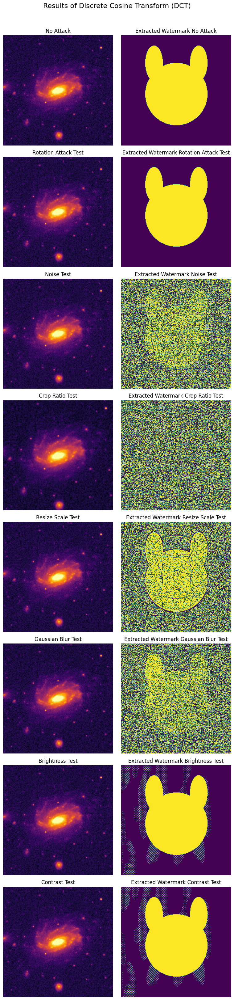

In [12]:
testing.plot_attack_examples(original_image, watermark, only_small_pertubations = True)

# Discrete Wavelet Transform

The Discrete Wavelet Transform (DWT) is a powerful tool in image processing, utilized for purposes ranging from compression to watermarking. The `DiscreteWaveletTransform` class provides a framework for embedding and extracting watermarks in images using DWT, capitalizing on its ability to decompose images into frequency sub-bands.

DWT decomposes an image into a set of wavelet coefficients, representing different frequency bands within the image. These coefficients are divided into approximate (low-frequency) and detail (high-frequency) components. For watermarking, modifications are typically made to the approximate component to maintain image quality while embedding the watermark.

### Embedding Watermarks

1. **DWT Application**: The image is decomposed using DWT into four sub-bands: LL (low-low), LH (low-high), HL (high-low), and HH (high-high). The LL sub-band represents the approximate image, while the other three capture details in various orientations.

2. **Watermark Embedding**: The watermark is embedded into the LL sub-band by adding a scaled version of the watermark to it. This scaling is controlled by a factor $\alpha$, which adjusts the strength of the watermarking to balance visibility and robustness.

3. **Inverse DWT**: The inverse DWT (IDWT) is applied to the modified and unmodified sub-bands to reconstruct the watermarked image.

### Extracting Watermarks

1. **DWT on Original and Watermarked Images**: Both the original and the watermarked images are decomposed using DWT to obtain their respective wavelet coefficients.

2. **Watermark Extraction**: The difference between the LL sub-bands of the watermarked and original images, divided by $\alpha$, estimates the watermark. This difference highlights the changes made to the approximate component during embedding.

3. **Normalization and Thresholding**: The estimated differences are normalized to a 0-1 range, and a threshold is applied to binarize the estimated watermark, distinguishing watermarked areas from the rest of the image.



In [13]:
import numpy as np
import pywt

class DiscreteWaveletTransform:
    def __init__(self, alpha: float = 0.1, wavelet='haar'):
        """
        Initializes the DiscreteWaveletTransform object with the specified wavelet.

        Args:
            alpha (float, optional): A scaling factor used to control the strength of the watermark embedding.
                                      Values closer to 0 result in less visible watermarks,
                                      while values closer to 1 lead to more robust but potentially more noticeable watermarks.
                                      Defaults to 0.1 for a balance between visibility and robustness.
            wavelet (str): The name of the wavelet to be used in DWT and IDWT.
        """
        self.wavelet = wavelet
        self.alpha = alpha
        self.watermark_size_is_same_size_image = False
        self.name = 'Discrete Wavelet Transform (DWT)'

    def encode(self, image: np.ndarray, watermark: np.ndarray, key: int = 42) -> np.ndarray:
        """
        Embeds a watermark into a grayscale image using Discrete Wavelet Transform.

        Args:
            image (np.ndarray): A numpy array of integers (0-255) representing the pixel values of the image.
            watermark (np.ndarray): A numpy array of the same shape as image with integers (each 0 or 1) representing the watermark to be embedded.
            key (int): The seed used during encoding, allowing for the reconstruction of the modified pixel positions.

        Returns:
            watermarked_image (np.ndarray): A numpy array of the same shape as image with the watermark embedded.
            watermark (np.ndarray): A numpy array of the same shape as image with integers (each 0 or 1) representing the watermark to be embedded.
        """
        # Check dimensions
        if image.shape[0] //2 != watermark.shape[0] and image.shape[1] //2 != watermark.shape[1]:
            raise ValueError("Watermark dimensions: half image width x half image height")

        # Decompose the image using DWT
        coeffs = pywt.dwt2(image, self.wavelet)
        LL, (LH, HL, HH) = coeffs

        # Embed the watermark into the LL sub-band
        LL_marked = LL + self.alpha * watermark

        # Reconstruct the image with the embedded watermark
        watermarked_image = pywt.idwt2((LL_marked, (LH, HL, HH)), self.wavelet)

        return watermarked_image, watermark

    def decode(self, original_image: np.ndarray, watermarked_image: np.ndarray, key: int = 42) -> np.ndarray:
        """
        Extracts the watermark from a watermarked image using Discrete Wavelet Transform.

        Args:
            original_image (np.ndarray): A numpy array of integers (0-255) representing the pixel values of the original image.
            watermarked_image (np.ndarray): A numpy array of integers (0-255) representing the pixel values of the watermarked image.
            key (int): The seed used during encoding, allowing for the reconstruction of the modified pixel positions.

        Returns:
            extracted_watermark (np.ndarray): A numpy array indicating the estimated watermark, represented by changes in specific pixels.
        """
        # Decompose both original and watermarked images
        coeffs_original = pywt.dwt2(original_image, self.wavelet)
        coeffs_watermarked = pywt.dwt2(watermarked_image, self.wavelet)

        # Extract the LL sub-bands
        LL_original, _ = coeffs_original
        LL_watermarked, _ = coeffs_watermarked

        # Estimate the watermark from the difference between the LL sub-bands
        estimated_differences = (LL_watermarked - LL_original) / self.alpha

        # Normalize the differences to a 0-1 range
        estimated_differences_normalized = (estimated_differences - np.min(estimated_differences)) / (np.max(estimated_differences) - np.min(estimated_differences))

        # Apply a threshold to convert to binary (0 and 1) values
        threshold = 0.5  # This threshold may need adjustment based on your specific use case
        estimated_watermark = np.where(estimated_differences_normalized > threshold, 1, 0)

        return estimated_watermark

In [17]:
dwt = DiscreteWaveletTransform(alpha = 0.01)
watermark = generate_dog_mask((128,128))
watermarked_image, watermark = dwt.encode(original_image, watermark)
extracted_watermark = dwt.decode(original_image, watermarked_image)
testing = TestSuite(dwt,100)

Executing the tests:

In [18]:
results = testing.execute_all_tests(original_image,watermarked_image,watermark, only_small_pertubations = True)
results

Starting No Attack
Starting Rotation Attack Test
Starting Noise Test
Starting Crop Ratio Test
Starting Resize Scale Test
Starting Gaussian Blur Test
Starting Brightness Test
Starting Contrast Test


[{'Test': 'No Attack',
  'Parameter Min. Value': '-',
  'Parameter Max. Value': '-',
  'Average NC': 1.0,
  'Average BER': 0.0,
  'Average FPR': 0.0},
 {'Test': 'Rotation Attack Test',
  'Parameter Min. Value': -5,
  'Parameter Max. Value': 5,
  'Average NC': 0.4474864563145539,
  'Average BER': 0.4883758544921875,
  'Average FPR': 0.5429702257803364},
 {'Test': 'Noise Test',
  'Parameter Min. Value': 0.5,
  'Parameter Max. Value': 0.6,
  'Average NC': 0.9659065476952243,
  'Average BER': 0.022457275390625,
  'Average FPR': 0.021795448412341458},
 {'Test': 'Crop Ratio Test',
  'Parameter Min. Value': 0.0,
  'Parameter Max. Value': 0.1,
  'Average NC': 0.5105262132308203,
  'Average BER': 0.395731201171875,
  'Average FPR': 0.39582891067734105},
 {'Test': 'Resize Scale Test',
  'Parameter Min. Value': 0.9,
  'Parameter Max. Value': 1.1,
  'Average NC': 0.5716662901818066,
  'Average BER': 0.6662786865234375,
  'Average FPR': 0.9803867949986508},
 {'Test': 'Gaussian Blur Test',
  'Parame

Visualizing:

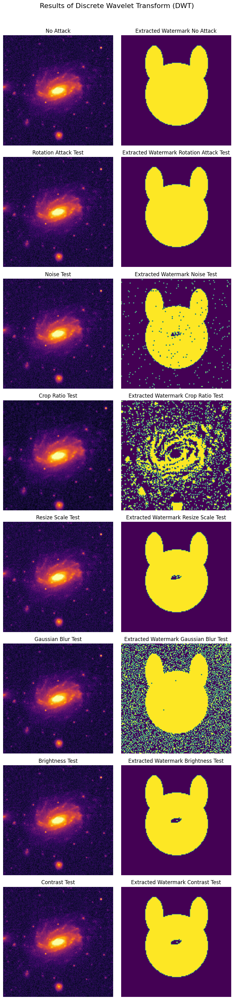

In [19]:
testing.plot_attack_examples(original_image, watermark, only_small_pertubations = True)

# Discrete Wavelet Transform + SVD

The integration of Discrete Wavelet Transform (DWT) with Singular Value Decomposition (SVD) offers a robust approach to digital image watermarking. The `DiscreteWaveletTransformSVD` class embodies this approach, exploiting the strengths of both DWT and SVD for embedding and extracting watermarks in images. This technique enhances the security and resilience of watermarks against various attacks.

The process combines the spatial-frequency decomposition capabilities of DWT with the mathematical robustness of SVD. DWT decomposes the image into frequency sub-bands, and SVD is applied to the approximate sub-band to embed the watermark. The singular values of this sub-band are modified according to the watermark's singular values, providing a subtle yet effective embedding method.

### Embedding Watermarks

1. **DWT Application**: The image is decomposed using DWT into sub-bands: LL, LH, HL, HH. The LL sub-band represents the low-frequency components, which are less sensitive to changes and ideal for watermarking.

2. **SVD on LL Sub-band**: SVD decomposes the LL sub-band into matrices U, S, and V, where S contains the singular values. SVD is known for its stability and the fact that small changes in singular values do not significantly affect image quality.

3. **Watermark Embedding**: The singular values of the LL sub-band are altered by adding a scaled version of the watermark's singular values. This scaling factor, denoted by $\alpha$, controls the embedding strength.

4. **Inverse Operations**: The modified LL sub-band is reconstructed using inverse SVD, followed by applying inverse DWT to obtain the watermarked image. The watermarked image maintains high visual similarity to the original while containing the embedded watermark.

### Extracting Watermarks

1. **DWT and SVD on Watermarked and Original Images**: The original and watermarked images are decomposed using DWT, followed by SVD on their respective LL sub-bands.

2. **Watermark Extraction**: The difference in singular values between the watermarked and original LL sub-bands, divided by $\alpha$, estimates the watermark's singular values. This process inversely mirrors the embedding method.

3. **Reconstruction of Watermark**: Utilizing the estimated singular values along with the U and V matrices from the watermark's SVD (stored during embedding), the watermark is reconstructed. The result is then thresholded to obtain a binary watermark image.



In [21]:
import numpy as np
import pywt
import scipy.linalg as la

class DiscreteWaveletTransformSVD:
    def __init__(self, wavelet='haar', alpha=0.1):
        """
        Initializes the DWT+SVD watermarking object with the specified wavelet and alpha.

        Args:
            wavelet (str): The name of the wavelet to be used in DWT and IDWT.
            alpha (float): Scaling factor used for modifying the singular values during watermark embedding.
        """
        self.wavelet = wavelet
        self.alpha = alpha
        self.Uw,self.Vw = (None, None)
        self.watermark_size_is_same_size_image = False
        self.name = 'Discrete Wavelet Transform (DWT) + SVD'

    def encode(self, image: np.ndarray, watermark: np.ndarray, key: int = 42) -> np.ndarray:
        """
        Embeds a watermark into an image using DWT followed by SVD.

        Args:
            image (np.ndarray): A numpy array of integers (0-255) representing the pixel values of the image.
            watermark (np.ndarray): A numpy array of the same shape as image with integers (each 0 or 1) representing the watermark to be embedded.
            key (int): The seed used during encoding, allowing for the reconstruction of the modified pixel positions.

        Returns:
            watermarked_image (np.ndarray): A numpy array of the same shape as image with the watermark embedded.
            watermark (np.ndarray): A numpy array of the same shape as image with integers (each 0 or 1) representing the watermark to be embedded.
        """
        # Perform DWT on the image
        coeffs = pywt.dwt2(image, self.wavelet)
        LL, (LH, HL, HH) = coeffs

        # Perform SVD on the LL sub-band
        U, s, V = la.svd(LL, full_matrices=False)

        # Perform SVD on the watermark
        self.Uw, sw, self.Vw = la.svd(watermark, full_matrices=False)
        # Modify the singular values of LL with those of the watermark
        s_marked = s + self.alpha * sw[:len(s)]

        # Reconstruct the LL sub-band with modified singular values
        LL_marked = np.dot(U, np.dot(np.diag(s_marked), V))

        # Perform inverse DWT to get the watermarked image
        watermarked_image = pywt.idwt2((LL_marked, (LH, HL, HH)), self.wavelet)
        watermarked_image = np.clip(watermarked_image, 0, 255).astype(np.uint8)

        return watermarked_image, watermark

    def decode(self, original_image: np.ndarray, watermarked_image: np.ndarray, key: int = 42) -> np.ndarray:
        """
        Extracts the watermark from a watermarked image using Discrete Wavelet Transform + SVD method.

        Args:
            original_image (np.ndarray): A numpy array of integers (0-255) representing the pixel values of the original image.
            watermarked_image (np.ndarray): A numpy array of integers (0-255) representing the pixel values of the watermarked image.
            key (int): The seed used during encoding, allowing for the reconstruction of the modified pixel positions.

        Returns:
            extracted_watermark (np.ndarray): A numpy array indicating the estimated watermark, represented by changes in specific pixels.
        """
        # Decompose both images using DWT
        coeffs_original = pywt.dwt2(original_image, self.wavelet)
        LL_original, _ = coeffs_original
        coeffs_watermarked = pywt.dwt2(watermarked_image, self.wavelet)
        LL_watermarked, _ = coeffs_watermarked

        # Perform SVD on both LL sub-bands
        U_original, s_original, V_original = la.svd(LL_original, full_matrices=False)
        U_watermarked, s_watermarked, V_watermarked = la.svd(LL_watermarked, full_matrices=False)

        # Estimate the singular values of the watermark
        sw_estimated = (s_watermarked - s_original) / self.alpha

        extracted_watermark = np.dot(self.Uw, np.dot(np.diag(sw_estimated), self.Vw))
        extracted_watermark = np.clip(extracted_watermark,0,255)
        extracted_watermark = np.where(extracted_watermark>0.5,255,0)
        extracted_watermark = np.array(extracted_watermark,dtype=np.uint32)
        return extracted_watermark


In [22]:
dwtsvd = DiscreteWaveletTransformSVD(alpha = 0.07)
watermark = generate_dog_mask((128,128))
watermarked_image, watermark = dwtsvd.encode(original_image, watermark)
extracted_watermark = dwtsvd.decode(original_image, watermarked_image)
testing = TestSuite(dwtsvd,100)

In [23]:
results = testing.execute_all_tests(original_image,watermarked_image,watermark, only_small_pertubations = True)
results

Starting No Attack
Starting Rotation Attack Test
Starting Noise Test
Starting Crop Ratio Test
Starting Resize Scale Test
Starting Gaussian Blur Test
Starting Brightness Test
Starting Contrast Test


[{'Test': 'No Attack',
  'Parameter Min. Value': '-',
  'Parameter Max. Value': '-',
  'Average NC': 0.900586675293756,
  'Average BER': 0.07489013671875,
  'Average FPR': 0.11037150310335521},
 {'Test': 'Rotation Attack Test',
  'Parameter Min. Value': -5,
  'Parameter Max. Value': 5,
  'Average NC': 0.0,
  'Average BER': 0.3670654296875,
  'Average FPR': 0.06719438697490332},
 {'Test': 'Noise Test',
  'Parameter Min. Value': 0.5,
  'Parameter Max. Value': 0.6,
  'Average NC': 0.9048981821263237,
  'Average BER': 0.0711279296875,
  'Average FPR': 0.10482684177385987},
 {'Test': 'Crop Ratio Test',
  'Parameter Min. Value': 0.0,
  'Parameter Max. Value': 0.1,
  'Average NC': 0.8522202312729898,
  'Average BER': 0.12117431640625,
  'Average FPR': 0.1785841504002878},
 {'Test': 'Resize Scale Test',
  'Parameter Min. Value': 0.9,
  'Parameter Max. Value': 1.1,
  'Average NC': 0.8615918268030371,
  'Average BER': 0.11118408203125,
  'Average FPR': 0.16295403436178824},
 {'Test': 'Gaussian B

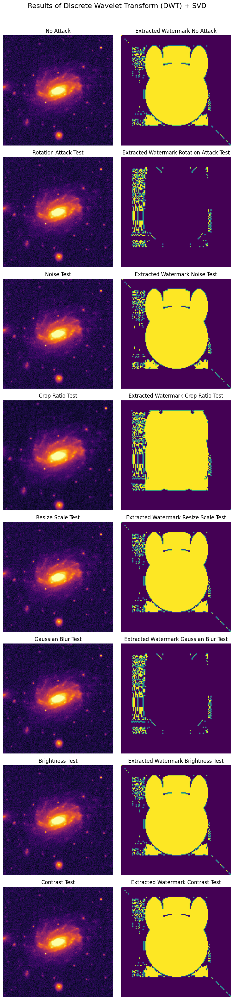

In [24]:
testing.plot_attack_examples(original_image, watermark, only_small_pertubations = True)